Что мы сегодня разберем:
1. Препроцессинг:
- поиск и исправление ошибок
- работа с пропусками данных
- оцифровка номинальных переменных
- отбор параметров модели
- разбиение на обучающую и тестовую выборку
- ребалансировка классов

2. Использование моделей машинного обучения
- обучение и предсказание
- рассчет метрик качества
- подбор параметров

In [4]:
#from google.colab import files

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import random
from time import process_time
from scipy import stats


from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import metrics
from sklearn.metrics import accuracy_score, make_scorer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.feature_selection import SelectFromModel

import lightgbm as lgb

from xgboost import XGBClassifier, XGBRegressor
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import ensemble
from sklearn.feature_selection import SelectKBest, f_classif, VarianceThreshold
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier as GBoost, RandomForestClassifier
from sklearn.neural_network import MLPClassifier

import seaborn as sns

%matplotlib inline

Воспроизводимость

In [9]:
!pip3 freeze > requirements.txt

# Подгрузка данных

In [ ]:
#uploaded = files.upload()

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')
#drive.mount("/content/drive", force_remount=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Анализ датафрейма и переменных

In [10]:
import pandas as pd
df = pd.read_excel("data/scoring case.xlsx")
print(df.shape[0], df.shape[1])
df

6797 122


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0.0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0.0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6792,107922,NaN,Cash loans,F,N,Y,0,112500.0,728460.0,40806.0,...,0,0,0,0,0.0,0.0,1.0,0.0,0.0,2.0
6793,107923,NaN,Cash loans,F,N,Y,0,180000.0,792477.0,23301.0,...,0,0,0,0,0.0,0.0,0.0,5.0,0.0,0.0
6794,107924,NaN,Cash loans,M,N,Y,0,54000.0,135000.0,10822.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
6795,107925,NaN,Cash loans,M,N,N,0,180000.0,327024.0,25965.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,6797.000000,5797.000000,6797.000000,6.797000e+03,6.797000e+03,6797.000000,6.793000e+03,6797.000000,6797.000000,6797.000000,...,6797.000000,6797.000000,6797.000000,6797.000000,5901.000000,5901.000000,5901.000000,5901.000000,5901.000000,5901.000000
mean,103971.114904,0.077454,0.410769,1.672061e+05,5.975752e+05,27034.174709,5.375022e+05,0.021008,-16022.379726,63698.839635,...,0.006768,0.000294,0.000441,0.000294,0.007965,0.008473,0.035248,0.270124,0.270802,1.871717
std,2293.971719,0.267333,0.712820,9.565286e+04,4.017468e+05,14412.328396,3.687270e+05,0.014016,4334.738642,141203.230776,...,0.081993,0.017152,0.021006,0.017152,0.090783,0.125938,0.201968,0.929682,0.618810,1.850327
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,2596.500000,4.500000e+04,0.000938,-25160.000000,-15632.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,101988.000000,0.000000,0.000000,1.125000e+05,2.700000e+05,16434.000000,2.385000e+05,0.010006,-19590.000000,-2807.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,103968.000000,0.000000,0.000000,1.440000e+05,5.084955e+05,24939.000000,4.500000e+05,0.018850,-15808.000000,-1218.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,105954.000000,0.000000,1.000000,2.025000e+05,8.086500e+05,34587.000000,6.795000e+05,0.028663,-12434.000000,-298.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,107926.000000,1.000000,7.000000,1.935000e+06,2.517300e+06,135936.000000,2.254500e+06,0.072508,-7705.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,4.000000,4.000000,16.000000,8.000000,13.000000


In [12]:
df.DAYS_EMPLOYED.describe()

count      6797.000000
mean      63698.839635
std      141203.230776
min      -15632.000000
25%       -2807.000000
50%       -1218.000000
75%        -298.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [13]:
not_nan = (df.TARGET == 0) | (df.TARGET == 1)

study = df[not_nan]
res = df[~not_nan]

In [14]:
print(study.shape[0], study.shape[1])
study.head()

5797 122


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0.0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0.0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
print(res.shape[0], res.shape[1])
res.head()

1000 122


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
5797,106777,NaN,Cash loans,F,N,N,0,90000.0,508495.5,22527.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
5798,106778,NaN,Cash loans,F,N,Y,0,112500.0,900000.0,39775.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
5799,106779,NaN,Cash loans,F,Y,Y,0,351000.0,1483231.5,51687.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,4.0
5800,106780,NaN,Cash loans,M,N,Y,1,157500.0,225000.0,16002.0,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,1.0
5801,106781,NaN,Revolving loans,F,N,N,0,697500.0,270000.0,13500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


# Подготовка данных


## Исправление ошибок

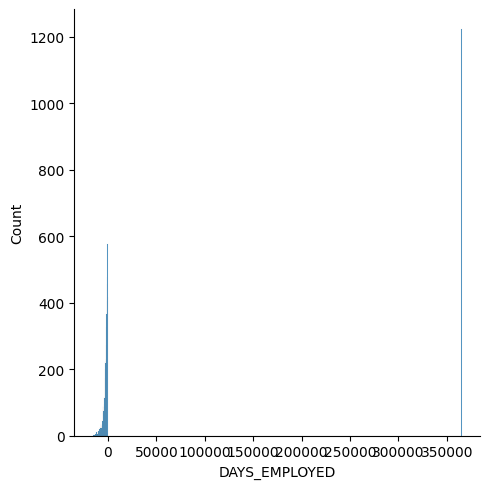

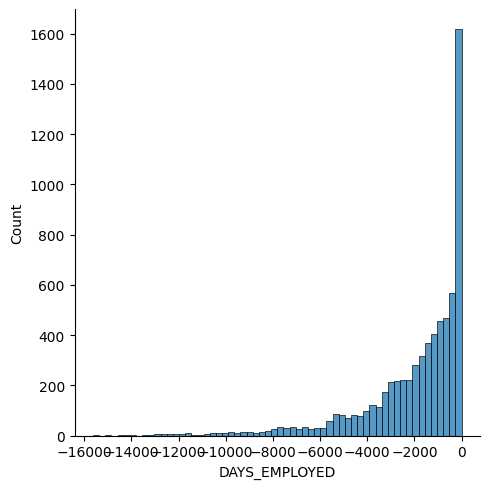

In [16]:
from matplotlib import pyplot as plt
import seaborn as sns

sns.displot(data=df, x = "DAYS_EMPLOYED")

df["DAYS_EMPLOYED"] = df["DAYS_EMPLOYED"].apply(lambda x: 0 if x > 0 else x)

sns.displot(data=df, x = "DAYS_EMPLOYED")

## Удаление строк или столбцов с пропусками

#### столбцы

In [ ]:
df_notna = df.notna().sum()
df_notna 

SK_ID_CURR                    6797
TARGET                        5797
NAME_CONTRACT_TYPE            6797
CODE_GENDER                   6797
FLAG_OWN_CAR                  6797
                              ... 
AMT_REQ_CREDIT_BUREAU_DAY     5901
AMT_REQ_CREDIT_BUREAU_WEEK    5901
AMT_REQ_CREDIT_BUREAU_MON     5901
AMT_REQ_CREDIT_BUREAU_QRT     5901
AMT_REQ_CREDIT_BUREAU_YEAR    5901
Length: 122, dtype: int64

In [ ]:
import numpy as np
na_col = np.unique(df_notna, return_counts=True)
na_col

(array([2078, 2094, 2162, 2166, 2208, 2294, 2305, 2798, 2847, 2966, 3105,
        3216, 3367, 3371, 3413, 3414, 3415, 3459, 3501, 3547, 3604, 4703,
        5474, 5797, 5901, 6769, 6778, 6793, 6797]),
 array([ 3,  3,  1,  3,  3,  1,  3,  3,  3,  1,  3,  3,  1,  3,  3,  3,  1,
         3,  3,  1,  1,  1,  1,  1,  6,  5,  1,  1, 57]))

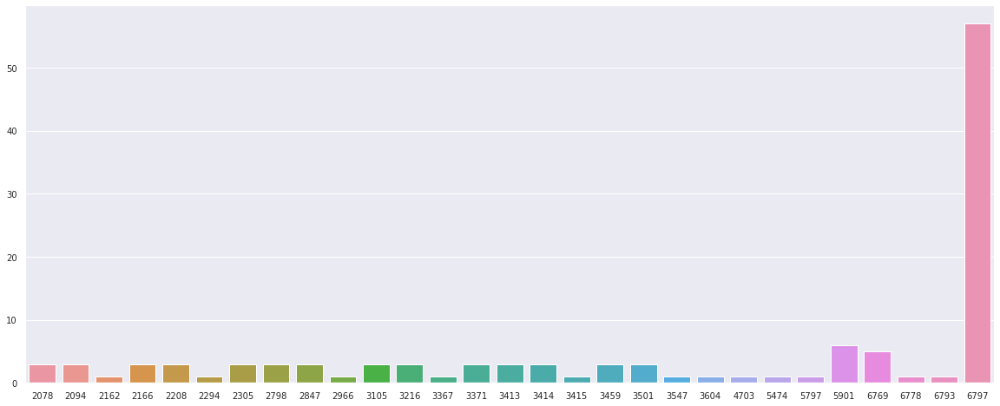

In [ ]:
plt.figure(figsize=(20, 8))
b = sns.barplot(x = na_col[0], y = na_col[1])
b.tick_params(labelsize=10)

In [ ]:
for i in df.iloc[:, 2:].columns:
  if df[i].notna().sum() < 0.8 * len(df):
    del df[i]

In [ ]:
df.shape

(6797, 72)

## Оцифровка номинальных данных (дамми переменные)

In [ ]:
print("Количество столбцов: {}".format(df.shape[1]))
df.head()

Количество столбцов: 72


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1.0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648,-2120,1,1,0,1,1,0,1,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0.0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186,-291,1,1,0,1,1,0,2,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,-828,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0.0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260,-2531,1,1,1,1,1,0,1,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,-815,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0.0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833,-2437,1,1,0,1,0,0,2,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,2.0,0.0,2.0,0.0,-617,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0.0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311,-3458,1,1,0,1,0,0,1,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,0.0,0.0,0.0,0.0,-1106,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_g = pd.get_dummies(df, drop_first=True)
print("Количество столбцов: {}".format(df_g.shape[1]))
df_g.head()

Количество столбцов: 151


,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,...,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
0,100002,1.0,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648,-2120,1,1,0,1,1,0,1,2,2,10,0,0,0,0,0,0,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,100003,0.0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186,-291,1,1,0,1,1,0,2,1,1,11,0,0,0,0,0,0,0.622246,NaN,1.0,0.0,1.0,0.0,-828,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100004,0.0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260,-2531,1,1,1,1,1,0,1,2,2,9,0,0,0,0,0,0,0.555912,0.729567,0.0,0.0,0.0,0.0,-815,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100006,0.0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833,-2437,1,1,0,1,0,0,2,2,2,17,0,0,0,0,0,0,0.650442,NaN,2.0,0.0,2.0,0.0,-617,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100007,0.0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311,-3458,1,1,0,1,0,0,1,2,2,11,0,0,0,0,1,1,0.322738,NaN,0.0,0.0,0.0,0.0,-1106,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_g.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,...,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA
count,6797.000000,5797.000000,6797.000000,6.797000e+03,6.797000e+03,6797.000000,6.793000e+03,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.0,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6778.000000,5474.000000,6769.000000,6769.000000,6769.000000,6769.000000,6797.000000,6797.0,6797.000000,6797.000000,6797.000000,6797.000000,...,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.00000,6797.00000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000,6797.000000
mean,103971.114904,0.077454,0.410769,1.672061e+05,5.975752e+05,27034.174709,5.375022e+05,0.021008,-16022.379726,-1966.445932,-4978.771517,-2963.736354,1.0,0.820215,0.202737,0.998235,0.280712,0.054289,2.148301,2.042666,2.022510,12.078564,0.017655,0.051052,0.038841,0.085038,0.235839,0.179050,0.514323,0.511949,1.388536,0.147289,1.373615,0.102969,-955.537737,0.0,0.706635,0.000147,0.016184,0.084596,...,0.000588,0.001913,0.011623,0.001471,0.001471,0.000147,0.004414,0.000147,0.009710,0.002354,0.023981,0.001324,0.036487,0.007503,0.001177,0.056496,0.007503,0.006179,0.000883,0.000294,0.004561,0.028542,0.008975,0.006179,0.13094,0.00868,0.002648,0.000883,0.005149,0.011917,0.000147,0.000588,0.002501,0.021921,0.000441,0.008975,0.004267,0.015889,0.003972,0.179785
std,2293.971719,0.267333,0.712820,9.565286e+04,4.017468e+05,14412.328396,3.687270e+05,0.014016,4334.738642,2304.153372,3541.401133,1527.490394,0.0,0.384037,0.402067,0.041984,0.449380,0.226603,0.899489,0.508843,0.504184,3.220649,0.131703,0.220120,0.193229,0.278958,0.424553,0.383422,0.190457,0.197010,2.257904,0.454

### Изучение скрытых номинальных данных

In [ ]:
list_uniq = []
list_len_uniq = []

for i in df_g.columns: 
  a = df_g[i].unique()

  list_uniq.append(a)
  list_len_uniq.append(len(a))

In [ ]:
hist_unique = np.unique(list_len_uniq, return_counts=True)
hist_unique

(array([   1,    2,    3,    4,    6,    7,    8,    9,   14,   16,   21,
          22,   79,  250,  343,  611, 1506, 2401, 3309, 3434, 3740, 5153,
        5542, 6435, 6797]),
 array([  5, 117,   3,   1,   2,   3,   1,   1,   1,   1,   2,   1,   1,
          1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1]))

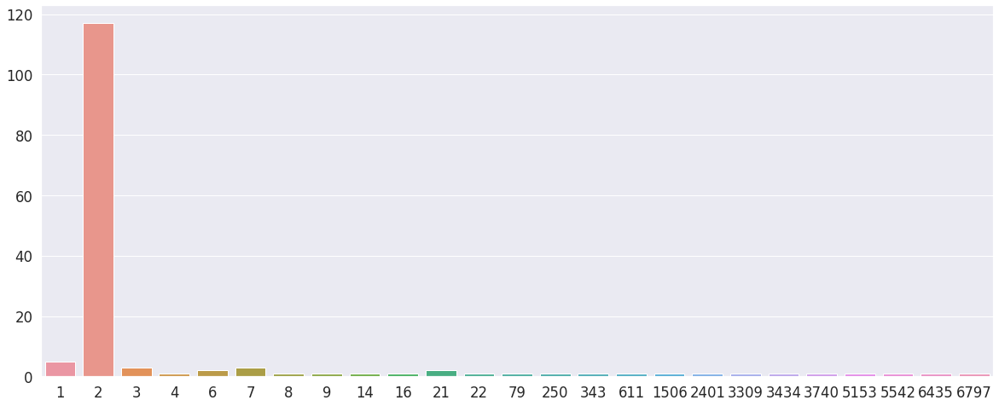

In [ ]:
plt.figure(figsize=(20, 8))
sns.barplot(x = hist_unique[0], y = hist_unique[1])

In [ ]:
from sklearn.impute import SimpleImputer

nom_col = list(set(df_g.columns) - set(df.columns))
hide_nom_col = []
to_drop = []

for i in range(len(df_g.columns)):
  if (list_len_uniq[i] <= 22) & (list_len_uniq[i] > 2) & (df_g.columns[i] != "TARGET"):
    col = df_g.columns[i]
    print(col)

    if i == "CNT_CHILDREN" and i =="CNT_FAM_MEMBERS" and i =="REGION_RATING_CLIENT" and i =="REGION_RATING_CLIENT_W_CITY": continue

    hide_nom_col.append(col)
    

    #df_g[df_g.columns[i]] = df_g[df_g.columns[i]].fillna()
    imp_mean = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
    imp_mean.fit(df_g[col].values.reshape(len(df_g[col]), 1))
    df_g[col] = imp_mean.transform(df_g[col].values.reshape(-1, 1))

    print(df_g[col].unique())
    print("\n")

  elif list_len_uniq[i] == 1:
    col = df_g.columns[i]
    to_drop.append(col)

CNT_CHILDREN
[0 1 2 3 4 7 5]


CNT_FAM_MEMBERS
[1 2 3 4 5 6 9 7]


REGION_RATING_CLIENT
[2 1 3]


REGION_RATING_CLIENT_W_CITY
[2 1 3]


HOUR_APPR_PROCESS_START
[10 11  9 17 16 14  8 15  7 13  6 12 19  3 18 21  4  5 20 22  1  2]


OBS_30_CNT_SOCIAL_CIRCLE
[ 2.  1.  0.  4.  8. 10.  7.  3.  6.  5. 12.  9. 13. 11. 14. 22. 16. 15.
 17. 20.]


DEF_30_CNT_SOCIAL_CIRCLE
[2. 0. 1. 3. 4. 5.]


OBS_60_CNT_SOCIAL_CIRCLE
[ 2.  1.  0.  4.  8. 10.  7.  3.  6.  5. 12.  9. 13. 11. 14. 21. 15. 22.
 16. 20.]


DEF_60_CNT_SOCIAL_CIRCLE
[2. 0. 1. 3. 5. 4.]


AMT_REQ_CREDIT_BUREAU_HOUR
[0. 1. 2.]


AMT_REQ_CREDIT_BUREAU_DAY
[0. 1. 3. 2. 4.]


AMT_REQ_CREDIT_BUREAU_WEEK
[0. 1. 3. 2. 4.]


AMT_REQ_CREDIT_BUREAU_MON
[ 0.  1.  2.  6.  5.  3.  7.  9.  4. 11.  8. 16. 12. 14. 10.]


AMT_REQ_CREDIT_BUREAU_QRT
[0. 1. 2. 4. 3. 8. 5. 6.]


AMT_REQ_CREDIT_BUREAU_YEAR
[ 1.  0.  2.  4.  5.  3.  8.  6.  9.  7. 10. 11. 13.]




In [ ]:
for col in hide_nom_col:
    df_g[col]= df_g[col].astype('str')

In [ ]:
for i in to_drop:
    del df_g[i]

In [ ]:
df_g = pd.get_dummies(df_g, drop_first=True)
print("Количество столбцов: {}".format(df_g.shape[1]))
df_g

Количество столбцов: 260


,SK_ID_CURR,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,...,AMT_REQ_CREDIT_BUREAU_DAY_2.0,AMT_REQ_CREDIT_BUREAU_DAY_3.0,AMT_REQ_CREDIT_BUREAU_DAY_4.0,AMT_REQ_CREDIT_BUREAU_WEEK_1.0,AMT_REQ_CREDIT_BUREAU_WEEK_2.0,AMT_REQ_CREDIT_BUREAU_WEEK_3.0,AMT_REQ_CREDIT_BUREAU_WEEK_4.0,AMT_REQ_CREDIT_BUREAU_MON_1.0,AMT_REQ_CREDIT_BUREAU_MON_10.0,AMT_REQ_CREDIT_BUREAU_MON_11.0,AMT_REQ_CREDIT_BUREAU_MON_12.0,AMT_REQ_CREDIT_BUREAU_MON_14.0,AMT_REQ_CREDIT_BUREAU_MON_16.0,AMT_REQ_CREDIT_BUREAU_MON_2.0,AMT_REQ_CREDIT_BUREAU_MON_3.0,AMT_REQ_CREDIT_BUREAU_MON_4.0,AMT_REQ_CREDIT_BUREAU_MON_5.0,AMT_REQ_CREDIT_BUREAU_MON_6.0,AMT_REQ_CREDIT_BUREAU_MON_7.0,AMT_REQ_CREDIT_BUREAU_MON_8.0,AMT_REQ_CREDIT_BUREAU_MON_9.0,AMT_REQ_CREDIT_BUREAU_QRT_1.0,AMT_REQ_CREDIT_BUREAU_QRT_2.0,AMT_REQ_CREDIT_BUREAU_QRT_3.0,AMT_REQ_CREDIT_BUREAU_QRT_4.0,AMT_REQ_CREDIT_BUREAU_QRT_5.0,AMT_REQ_CREDIT_BUREAU_QRT_6.0,AMT_REQ_CREDIT_BUREAU_QRT_8.0,AMT_REQ_CREDIT_BUREAU_YEAR_1.0,AMT_REQ_CREDIT_BUREAU_YEAR_10.0,AMT_REQ_CREDIT_BUREAU_YEAR_11.0,AMT_REQ_CREDIT_BUREAU_YEAR_13.0,AMT_REQ_CREDIT_BUREAU_YEAR_2.0,AMT_REQ_CREDIT_BUREAU_YEAR_3.0,AMT_REQ_CREDIT_BUREAU_YEAR_4.0,AMT_REQ_CREDIT_BUREAU_YEAR_5.0,AMT_REQ_CREDIT_BUREAU_YEAR_6.0,AMT_REQ_CREDIT_BUREAU_YEAR_7.0,AMT_REQ_CREDIT_BUREAU_YEAR_8.0,AMT_REQ_CREDIT_BUREAU_YEAR_9.0
0,100002,1.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648,-2120,1,0,1,1,0,0,0,0,0,0,0,0.262949,0.139376,-1134,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,100003,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186,-291,1,0,1,1,0,0,0,0,0,0,0,0.622246,NaN,-828,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100004,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260,-2531,1,1,1,1,0,0,0,0,0,0,0,0.555912,0.729567,-815,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100006,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833,-2437,1,0,1,0,0,0,0,0,0,0,0,0.650442,NaN,-617,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100007,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311,-3458,1,0,1,0,0,0,0,0,0,1,1,0.322738,NaN,-1106,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6792,107922,NaN,112500.0,728460.0,40806.0,675000.0,0.018634,-22753,0,-12195,-4297,0,0,1,0,0,0,0,0,0,0,0,0.565972,0.638044,-267,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6793,107923,NaN,180000.0,792477.0,23301.0,661500.0,0.072508,-23195,0,-12461,-4081,0,0,1,0,1,0,0,0,0,0,0,0.730558,0.651260,-699,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6794,107924,NaN,54000.0,135000.0,10822.5,135000.0,0.016612,-24866,0,-12426,-4502,0,0,1,1,0,0,

## Заполнение пропусков

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer

In [ ]:
df_g.head()

,SK_ID_CURR,TARGET,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,...,AMT_REQ_CREDIT_BUREAU_DAY_2.0,AMT_REQ_CREDIT_BUREAU_DAY_3.0,AMT_REQ_CREDIT_BUREAU_DAY_4.0,AMT_REQ_CREDIT_BUREAU_WEEK_1.0,AMT_REQ_CREDIT_BUREAU_WEEK_2.0,AMT_REQ_CREDIT_BUREAU_WEEK_3.0,AMT_REQ_CREDIT_BUREAU_WEEK_4.0,AMT_REQ_CREDIT_BUREAU_MON_1.0,AMT_REQ_CREDIT_BUREAU_MON_10.0,AMT_REQ_CREDIT_BUREAU_MON_11.0,AMT_REQ_CREDIT_BUREAU_MON_12.0,AMT_REQ_CREDIT_BUREAU_MON_14.0,AMT_REQ_CREDIT_BUREAU_MON_16.0,AMT_REQ_CREDIT_BUREAU_MON_2.0,AMT_REQ_CREDIT_BUREAU_MON_3.0,AMT_REQ_CREDIT_BUREAU_MON_4.0,AMT_REQ_CREDIT_BUREAU_MON_5.0,AMT_REQ_CREDIT_BUREAU_MON_6.0,AMT_REQ_CREDIT_BUREAU_MON_7.0,AMT_REQ_CREDIT_BUREAU_MON_8.0,AMT_REQ_CREDIT_BUREAU_MON_9.0,AMT_REQ_CREDIT_BUREAU_QRT_1.0,AMT_REQ_CREDIT_BUREAU_QRT_2.0,AMT_REQ_CREDIT_BUREAU_QRT_3.0,AMT_REQ_CREDIT_BUREAU_QRT_4.0,AMT_REQ_CREDIT_BUREAU_QRT_5.0,AMT_REQ_CREDIT_BUREAU_QRT_6.0,AMT_REQ_CREDIT_BUREAU_QRT_8.0,AMT_REQ_CREDIT_BUREAU_YEAR_1.0,AMT_REQ_CREDIT_BUREAU_YEAR_10.0,AMT_REQ_CREDIT_BUREAU_YEAR_11.0,AMT_REQ_CREDIT_BUREAU_YEAR_13.0,AMT_REQ_CREDIT_BUREAU_YEAR_2.0,AMT_REQ_CREDIT_BUREAU_YEAR_3.0,AMT_REQ_CREDIT_BUREAU_YEAR_4.0,AMT_REQ_CREDIT_BUREAU_YEAR_5.0,AMT_REQ_CREDIT_BUREAU_YEAR_6.0,AMT_REQ_CREDIT_BUREAU_YEAR_7.0,AMT_REQ_CREDIT_BUREAU_YEAR_8.0,AMT_REQ_CREDIT_BUREAU_YEAR_9.0
0,100002,1.0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648,-2120,1,0,1,1,0,0,0,0,0,0,0,0.262949,0.139376,-1134,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,100003,0.0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186,-291,1,0,1,1,0,0,0,0,0,0,0,0.622246,NaN,-828,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,100004,0.0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260,-2531,1,1,1,1,0,0,0,0,0,0,0,0.555912,0.729567,-815,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100006,0.0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833,-2437,1,0,1,0,0,0,0,0,0,0,0,0.650442,NaN,-617,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100007,0.0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311,-3458,1,0,1,0,0,0,0,0,0,1,1,0.322738,NaN,-1106,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
"""imp = IterativeImputer(max_iter=10, random_state=0)

imp.fit(df_g.iloc[:,2:].values)
df_g_it = imp.transform(df_g.iloc[:,2:].values)"""

'imp = IterativeImputer(max_iter=10, random_state=0)\n\nimp.fit(df_g.iloc[:,2:].values)\ndf_g_it = imp.transform(df_g.iloc[:,2:].values)'

In [ ]:
#df_g_it

In [ ]:
knn = KNNImputer(n_neighbors=8)

knn.fit(df_g.iloc[:,2:].values)
df_g_knn = knn.transform(df_g.iloc[:,2:].values)

In [ ]:
df_g_knn

array([[ 202500. ,  406597.5,   24700.5, ...,       0. ,       0. ,
              0. ],
       [ 270000. , 1293502.5,   35698.5, ...,       0. ,       0. ,
              0. ],
       [  67500. ,  135000. ,    6750. , ...,       0. ,       0. ,
              0. ],
       ...,
       [  54000. ,  135000. ,   10822.5, ...,       0. ,       0. ,
              0. ],
       [ 180000. ,  327024. ,   25965. , ...,       0. ,       0. ,
              0. ],
       [ 270000. , 1773963. ,   61659. , ...,       0. ,       0. ,
              0. ]])

In [ ]:
#np.array_equal(df_g_knn, df_g_it)

In [ ]:
# ОЧЕНЬ ВАЖНОЕ МЕСТО
df2 = df_g_knn  #df_g_it

In [ ]:
df3 = pd.DataFrame(data = df2, columns = df_g.iloc[:,2:].columns)
df3['SK_ID_CURR'] = df_g['SK_ID_CURR']
df3['TARGET'] = df_g['TARGET']

df3.head()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,NAME_CONTRACT_TYPE_Revolving loans,...,AMT_REQ_CREDIT_BUREAU_DAY_4.0,AMT_REQ_CREDIT_BUREAU_WEEK_1.0,AMT_REQ_CREDIT_BUREAU_WEEK_2.0,AMT_REQ_CREDIT_BUREAU_WEEK_3.0,AMT_REQ_CREDIT_BUREAU_WEEK_4.0,AMT_REQ_CREDIT_BUREAU_MON_1.0,AMT_REQ_CREDIT_BUREAU_MON_10.0,AMT_REQ_CREDIT_BUREAU_MON_11.0,AMT_REQ_CREDIT_BUREAU_MON_12.0,AMT_REQ_CREDIT_BUREAU_MON_14.0,AMT_REQ_CREDIT_BUREAU_MON_16.0,AMT_REQ_CREDIT_BUREAU_MON_2.0,AMT_REQ_CREDIT_BUREAU_MON_3.0,AMT_REQ_CREDIT_BUREAU_MON_4.0,AMT_REQ_CREDIT_BUREAU_MON_5.0,AMT_REQ_CREDIT_BUREAU_MON_6.0,AMT_REQ_CREDIT_BUREAU_MON_7.0,AMT_REQ_CREDIT_BUREAU_MON_8.0,AMT_REQ_CREDIT_BUREAU_MON_9.0,AMT_REQ_CREDIT_BUREAU_QRT_1.0,AMT_REQ_CREDIT_BUREAU_QRT_2.0,AMT_REQ_CREDIT_BUREAU_QRT_3.0,AMT_REQ_CREDIT_BUREAU_QRT_4.0,AMT_REQ_CREDIT_BUREAU_QRT_5.0,AMT_REQ_CREDIT_BUREAU_QRT_6.0,AMT_REQ_CREDIT_BUREAU_QRT_8.0,AMT_REQ_CREDIT_BUREAU_YEAR_1.0,AMT_REQ_CREDIT_BUREAU_YEAR_10.0,AMT_REQ_CREDIT_BUREAU_YEAR_11.0,AMT_REQ_CREDIT_BUREAU_YEAR_13.0,AMT_REQ_CREDIT_BUREAU_YEAR_2.0,AMT_REQ_CREDIT_BUREAU_YEAR_3.0,AMT_REQ_CREDIT_BUREAU_YEAR_4.0,AMT_REQ_CREDIT_BUREAU_YEAR_5.0,AMT_REQ_CREDIT_BUREAU_YEAR_6.0,AMT_REQ_CREDIT_BUREAU_YEAR_7.0,AMT_REQ_CREDIT_BUREAU_YEAR_8.0,AMT_REQ_CREDIT_BUREAU_YEAR_9.0,SK_ID_CURR,TARGET
0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461.0,-637.0,-3648.0,-2120.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.262949,0.139376,-1134.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100002,1.0
1,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765.0,-1188.0,-1186.0,-291.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.622246,0.516197,-828.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100003,0.0
2,67500.0,135000.0,6750.0,135000.0,0.010032,-19046.0,-225.0,-4260.0,-2531.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.555912,0.729567,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100004,0.0
3,135000.0,312682.5,29686.5,297000.0,0.008019,-19005.0,-3039.0,-9833.0,-2437.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.650442,0.444297,-617.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100006,0.0
4,121500.0,513000.0,21865.5,513000.0,0.028663,-19932.0,-3038.0,-4311.0,-3458.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.322738,0.496277,-1106.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100007,0.0


## Поиск выбросов

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn import preprocessing

df_for_clust = preprocessing.normalize(df3.iloc[:, :-2].values)
df_for_clust

array([[0.35237493, 0.7075297 , 0.04298191, ..., 0.        , 0.        ,
        0.        ],
       [0.15528072, 0.74391112, 0.0205307 , ..., 0.        , 0.        ,
        0.        ],
       [0.33158493, 0.66316986, 0.03315849, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.2690729 , 0.67268225, 0.05392669, ..., 0.        , 0.        ,
        0.        ],
       [0.38981041, 0.70820756, 0.05623015, ..., 0.        , 0.        ,
        0.        ],
       [0.11164719, 0.73354806, 0.0254965 , ..., 0.        , 0.        ,
        0.        ]])

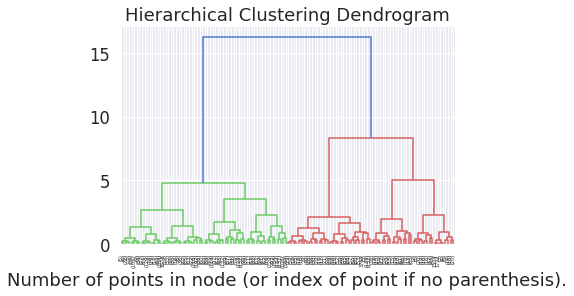

In [ ]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)



# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(df_for_clust)
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode='level', p=6)
#weekday_count_plot.set_xticklabels({'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'}, rotation=90)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
from sklearn.cluster import DBSCAN

outlier_detection = DBSCAN(eps=7)
clusters = outlier_detection.fit_predict(df_for_clust)
list(clusters).count(-1)

0

## Отбор признаков

#### По корреляции

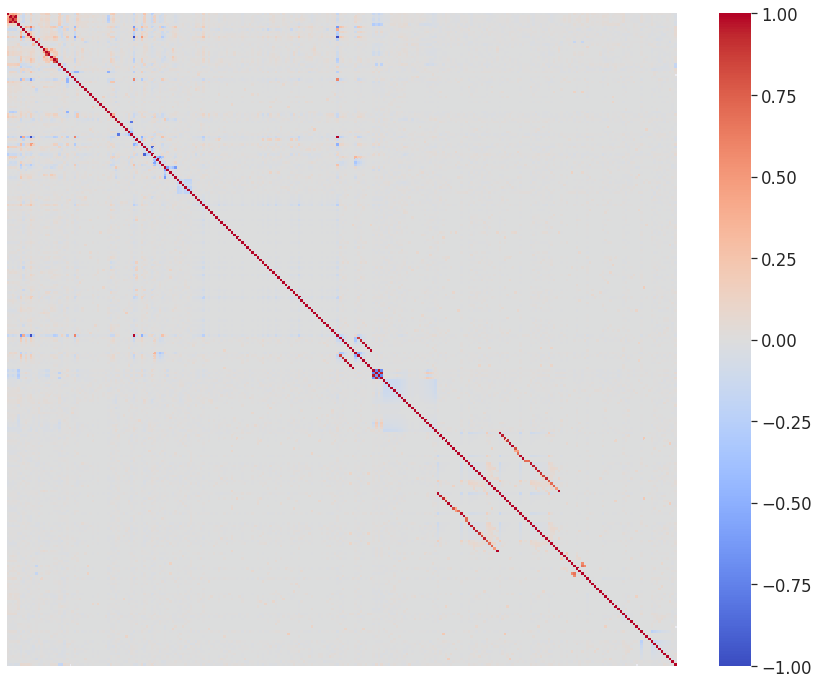

In [ ]:
cor = df3.corr()

plt.figure(figsize=(15, 12))
sns.heatmap(cor, xticklabels=False, yticklabels=False, cmap= 'coolwarm')

In [ ]:
cor.style.background_gradient(cmap='coolwarm')


In [ ]:
df3.shape

(6797, 260)

In [ ]:
all_features = list(cor.columns)
f_to_del = []

for i in cor.columns:
    if i =='TARGET':
        continue
    for j in cor.index:
        if all_features.index(j) >= all_features.index(i) or j =='TARGET' :
            continue
        else:
            if abs(cor.loc[i, j]) > 0.8: 
                if abs(cor.loc['TARGET', i]) > abs(cor.loc['TARGET', j]):
                    f_to_del.append(j)
                else:
                    f_to_del.append(i)

In [ ]:
f_to_del = set(f_to_del)
f_to_del

{'AMT_CREDIT',
 'CNT_CHILDREN_1',
 'CNT_FAM_MEMBERS_4',
 'CNT_FAM_MEMBERS_5',
 'CNT_FAM_MEMBERS_6',
 'CNT_FAM_MEMBERS_7',
 'CNT_FAM_MEMBERS_9',
 'DEF_60_CNT_SOCIAL_CIRCLE_5.0',
 'LIVE_CITY_NOT_WORK_CITY',
 'NAME_EDUCATION_TYPE_Secondary / secondary special',
 'NAME_INCOME_TYPE_Pensioner',
 'NAME_TYPE_SUITE_Family',
 'OBS_30_CNT_SOCIAL_CIRCLE_10.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_12.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_15.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_3.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_4.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_6.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_7.0',
 'OBS_30_CNT_SOCIAL_CIRCLE_9.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_1.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_11.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_13.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_14.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_2.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_20.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_5.0',
 'OBS_60_CNT_SOCIAL_CIRCLE_8.0',
 'ORGANIZATION_TYPE_XNA',
 'REGION_RATING_CLIENT_3',
 'REGION_RATING_CLIENT_W_CITY_2',
 'REG_REGION_NOT_WORK_REGION'}

In [ ]:
for i in f_to_del:
    del df3[i]

In [ ]:
df3.shape

(6797, 228)

### по модели

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression

In [ ]:
not_nan = (df.TARGET == 0) | (df.TARGET == 1)

scaler = MinMaxScaler() # попробовать поменять на scaler
scaler.fit(df3)
df3_norm = pd.DataFrame(data = scaler.transform(df3), columns=df3.columns)

X_all = df3_norm.iloc[:, :-2].values
X = df3_norm[not_nan].iloc[:, :-2].values
y = df3_norm[not_nan].iloc[:, -1].values

In [ ]:
y

array([1., 0., 0., ..., 0., 0., 0.])

In [ ]:
from sklearn.feature_selection import SelectFromModel

log_r = LogisticRegression(penalty= "l2").fit(X, y)
model = SelectFromModel(log_r, prefit = True, max_features=100)
X_new = model.transform(X_all)
X_new

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


array([[0.16577233, 0.13849287, 0.95925026, ..., 0.        , 0.        ,
        0.        ],
       [0.24825352, 0.49083503, 0.92400205, ..., 0.        , 0.        ,
        0.        ],
       [0.03114981, 0.0407332 , 0.98560645, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.06169215, 0.0407332 , 1.        , ..., 0.        , 0.        ,
        0.        ],
       [0.17525564, 0.10183299, 0.91274309, ..., 0.        , 0.        ,
        0.        ],
       [0.44294826, 0.71283096, 0.94498465, ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
X_new.shape

(6797, 85)

## Разбиение на обучающую и тестовую выборку



In [ ]:
from sklearn.model_selection import train_test_split

not_nan = (df.TARGET == 0) | (df.TARGET == 1)

X = X_new[:-1000]   #df3_norm[not_nan].iloc[:, :-2].values #X_new         #df3_norm[not_nan].iloc[:, :-2].values
y = df[not_nan].TARGET.values
X_to_pred = X_new[-1000:]

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=22)
print("Размер обучающей выборки {},\nРазмер тестовой выборки {} \n".format(len(X_train), len(X_test)))
print("Количество объектов 1 класса в обечающей выборке {},\nВ тестовой выборки {}".format(y_train.sum(), y_test.sum()))

Размер обучающей выборки 4637,
Размер тестовой выборки 1160 

Количество объектов 1 класса в обечающей выборке 365.0,
В тестовой выборки 84.0


In [ ]:
train = pd.DataFrame(data = X_train)
print(len(train))
train['TARGET'] = y_train

train.head()

4637


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,TARGET
0,0.168607,0.189409,0.896430,0.804013,0.339756,0.0,0.216565,0.697349,0.859866,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.256994,0.386965,0.974092,0.842095,0.350514,0.0,0.759776,0.373159,0.770222,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.101752,0.087576,0.402828,0.513894,0.885999,0.0,0.339810,0.620500,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.126152,0.101833,0.977738,0.893999,0.604849,0.0,0.824470,0.575689,0.443328,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.131619,0.193483,1.000000,0.596301,0.258831,0.0,0.760288,0.472303,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
train_1 = train[train.TARGET == 1]
train_0 = train[train.TARGET == 0]
train_2 = df[~not_nan].values

print("ДО РЕБАЛАНСИРОВКИ:\nКоличество объектов 0 класса в обучающей выборке {}\nКоличество объектов 1 класса {}\n".format(train_0.shape[0], train_1.shape[0]))

train_0 = train_0.sample(train_1.shape[0]*2, random_state=0)

train_1 = pd.concat([train_1, train_1.copy()])
#train_1 = pd.concat([train_1, train_1.copy()])
train_bal = pd.concat([train_1, train_0])

print("ПОСЛЕ РЕБАЛАНСИРОВКИ:\nКоличество объектов 0 класса в обучающей выборке {}\nКоличество объектов 1 класса {}\n".format(train_0.shape[0], train_1.shape[0]))

X_train = train_bal.iloc[:,:-1].values
y_train = train_bal.loc[:,["TARGET"]].values

ДО РЕБАЛАНСИРОВКИ:
Количество объектов 0 класса в обучающей выборке 4272
Количество объектов 1 класса 365

ПОСЛЕ РЕБАЛАНСИРОВКИ:
Количество объектов 0 класса в обучающей выборке 730
Количество объектов 1 класса 730



In [ ]:
X_train

array([[0.14714319, 0.18329939, 0.95675537, ..., 0.        , 0.        ,
        0.        ],
       [0.16948466, 0.22403259, 0.99149181, ..., 0.        , 0.        ,
        0.        ],
       [0.10077284, 0.0814664 , 0.97607472, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.08177247, 0.10183299, 0.95630757, ..., 1.        , 0.        ,
        0.        ],
       [0.14565826, 0.18329939, 0.81832139, ..., 0.        , 0.        ,
        0.        ],
       [0.1718808 , 0.09164969, 1.        , ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
print("Балансировка обучающей выборки")
print(np.unique(y_train, return_counts = True)[1])

print("")
print("Балансировка тестовой выборки")
print(np.unique(y_test, return_counts = True)[1])

Балансировка обучающей выборки
[730 730]

Балансировка тестовой выборки
[1076   84]


In [ ]:
test_mean = np.mean(X_test, axis=0)
pred_mean = np.mean(X_new[-1000:], axis=0)

print(len(test_mean), len(pred_mean))

85 85


In [ ]:
from scipy.stats import ttest_ind

ttest_ind(test_mean, pred_mean)

Ttest_indResult(statistic=0.017875985791468835, pvalue=0.9857589986530099)

In [ ]:
len(X_new[-1000:])

1000

In [ ]:
y_test2 = pd.read_excel("/content/drive/MyDrive/Course_work/Target_znachenia.xlsx")
y_test2 = y_test2.TARGET.values

# Подбор и валидация моделей

In [ ]:
def results(y_test, y_pred, time = 0):
    report = metrics.classification_report(y_test, y_pred, target_names=['recovered', 'uncovered'])
    print(report)
    
    print('\nПлощадь под ROC-кривой - ' + str(round(metrics.roc_auc_score(y_test, y_pred), 4)))
    if time != 0:
        print('\nВремя работы кода - ' + str(round(time, 4)) + ' сек')
        
def ROC_curve(y_test, model):
    sns.set(font_scale=1.5)
    sns.set_color_codes("muted")

    plt.figure(figsize=(6, 5))
    fpr, tpr, thresholds = metrics.roc_curve(y_test, model.predict_proba(X_test)[:,1], pos_label=1)
    lw = 2
    plt.plot(fpr, tpr, lw=lw, label='ROC curve ')
    plt.plot([0, 1], [0, 1])
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve')
    plt.savefig("ROC.png")
    plt.show()

           
def ROC_curve_all(y_test, y_pred):
    sns.set(font_scale=1.5)
    sns.set_color_codes("muted")

    plt.figure(figsize=(6, 5))
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred, pos_label=1)
    lw = 2
    plt.plot(fpr, tpr, lw=lw, label='ROC curve ')
    plt.plot([0, 1], [0, 1])
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve')
    plt.savefig("ROC.png")
    plt.show()

In [ ]:
from sklearn.metrics import make_scorer
from sklearn import metrics

roc_auc_scorer = make_scorer(metrics.roc_auc_score, greater_is_better=True,
                             needs_threshold=True)

# ВСЕ МОДЕЛИ

In [ ]:
from xgboost import XGBClassifier, XGBRegressor
import lightgbm as lgb

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier as GBoost, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [ ]:
clf = LogisticRegression(random_state=0, C = 1, penalty = 'l2', solver = "liblinear")
clf.fit(X_train, y_train)

rf = RandomForestClassifier(n_estimators= 250, max_depth=None, random_state=11, criterion='entropy')
rf.fit(X_train, y_train)

XGB = XGBClassifier(refresh_leaf =0, verbosity=0, max_depth = 3, n_estimators=150, reg_alpha=0, reg_lambda=10, sampling_method = 'gradient_based' )
xgb_model = XGB.fit(X_train, y_train,  eval_metric="auc", eval_set=[(X_test, y_test)], early_stopping_rounds=20)

GB = GBoost(loss = 'exponential', max_depth=3, n_estimators=100, )
GB.fit(X_train, y_train)

lgb = lgb.LGBMClassifier(refresh_leaf =0, verbosity=0, max_depth = 3, n_estimators=150, reg_alpha=0, reg_lambda=10, sampling_method = 'gradient_based' )
lgb.fit(X_train, y_train)

nn = MLPClassifier(activation='logistic',solver = 'adam',
                      hidden_layer_sizes=(100, 100))
nn.fit(X_train, y_train)

lda = LDA()
lda.fit(X_train, y_train)

svm = SVC(gamma='auto', probability=True)
svm.fit(X_train, y_train)

Bayes = GaussianNB()
Bayes.fit(X_train, y_train)

neigh = KNeighborsClassifier(n_neighbors=7)
neigh.fit(X_train, y_train)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """


[0]	validation_0-auc:0.642686
Will train until validation_0-auc hasn't improved in 20 rounds.
[1]	validation_0-auc:0.656184
[2]	validation_0-auc:0.660692
[3]	validation_0-auc:0.661848
[4]	validation_0-auc:0.672248
[5]	validation_0-auc:0.683174
[6]	validation_0-auc:0.694293
[7]	validation_0-auc:0.695665
[8]	validation_0-auc:0.698348
[9]	validation_0-auc:0.698647
[10]	validation_0-auc:0.697336
[11]	validation_0-auc:0.699449
[12]	validation_0-auc:0.702497
[13]	validation_0-auc:0.705661
[14]	validation_0-auc:0.708604
[15]	validation_0-auc:0.707078
[16]	validation_0-auc:0.707255
[17]	validation_0-auc:0.710784
[18]	validation_0-auc:0.710397
[19]	validation_0-auc:0.708737
[20]	validation_0-auc:0.712803
[21]	validation_0-auc:0.71251
[22]	validation_0-auc:0.712775
[23]	validation_0-auc:0.71168
[24]	validation_0-auc:0.712892
[25]	validation_0-auc:0.71324
[26]	validation_0-auc:0.714031
[27]	validation_0-auc:0.715425
[28]	validation_0-auc:0.715016
[29]	validation_0-auc:0.714485
[30]	validation_0-a

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[36]	validation_0-auc:0.717516
[37]	validation_0-auc:0.717461
[38]	validation_0-auc:0.718778
[39]	validation_0-auc:0.718451
[40]	validation_0-auc:0.717931
[41]	validation_0-auc:0.719901
[42]	validation_0-auc:0.721732
[43]	validation_0-auc:0.721831
[44]	validation_0-auc:0.721798
[45]	validation_0-auc:0.722716
[46]	validation_0-auc:0.722645
[47]	validation_0-auc:0.722268
[48]	validation_0-auc:0.723834
[49]	validation_0-auc:0.724597
[50]	validation_0-auc:0.724575
[51]	validation_0-auc:0.724354
[52]	validation_0-auc:0.724719
[53]	validation_0-auc:0.725283
[54]	validation_0-auc:0.726401
[55]	validation_0-auc:0.726157
[56]	validation_0-auc:0.725969
[57]	validation_0-auc:0.725781
[58]	validation_0-auc:0.727297
[59]	validation_0-auc:0.727186
[60]	validation_0-auc:0.727352
[61]	validation_0-auc:0.726876
[62]	validation_0-auc:0.726976
[63]	validation_0-auc:0.72619
[64]	validation_0-auc:0.725792
[65]	validation_0-auc:0.726047
[66]	validation_0-auc:0.725781
[67]	validation_0-auc:0.725604
[68]	vali

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_gb.py:1454: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sa

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                     weights='uniform')

In [ ]:
import seaborn as sns
models = [clf, rf, XGB, GB, lgb, nn, lda, svm, Bayes, neigh]
test_list = []
to_pred_list = []

for model in models:
  test_list.append(metrics.roc_auc_score(y_test, model.predict_proba(X_test)[:,1]))
  to_pred_list.append(metrics.roc_auc_score(y_test2, model.predict_proba(X_to_pred)[:,1]))


names =  ['log_reg', 'rf', 'XGB', 'GB', 'LGBM', 'NN', 'LDA', 'SVM', 'Bayes', 'KNN']
names2 = [i+", " + i for i in names]
print(names2)
names2 = ', '.join(names2)
print(names2)
names2 = names2.split(', ')
print(names2)


print()
data = [[test_list[i], to_pred_list[i]] for i in range(10)]
print(data)
data = np.array(data).flatten()
print(data)


['log_reg, log_reg', 'rf, rf', 'XGB, XGB', 'GB, GB', 'LGBM, LGBM', 'NN, NN', 'LDA, LDA', 'SVM, SVM', 'Bayes, Bayes', 'KNN, KNN']
log_reg, log_reg, rf, rf, XGB, XGB, GB, GB, LGBM, LGBM, NN, NN, LDA, LDA, SVM, SVM, Bayes, Bayes, KNN, KNN
['log_reg', 'log_reg', 'rf', 'rf', 'XGB', 'XGB', 'GB', 'GB', 'LGBM', 'LGBM', 'NN', 'NN', 'LDA', 'LDA', 'SVM', 'SVM', 'Bayes', 'Bayes', 'KNN', 'KNN']

[[0.7540272614622057, 0.7203125869069469], [0.7453199681359532, 0.7239835363479615], [0.7354067091520624, 0.7264725513098614], [0.7217372543813064, 0.7139579509427665], [0.7405956806514428, 0.7211468935980867], [0.7309147636749866, 0.6876216697257912], [0.7432731456895025, 0.7049613437899772], [0.7523344839794653, 0.7272790477779632], [0.514980527526996, 0.4887924801156906], [0.6432001239157372, 0.620091495633795]]
[0.75402726 0.72031259 0.74531997 0.72398354 0.73540671 0.72647255
 0.72173725 0.71395795 0.74059568 0.72114689 0.73091476 0.68762167
 0.74327315 0.70496134 0.75233448 0.72727905 0.51498053 0.488

In [ ]:
df1

,Name,Data,Cat
0,log_reg,0.754027,Test
1,log_reg,0.720313,Pred
2,rf,0.745320,Test
3,rf,0.723984,Pred
4,XGB,0.735407,Test
5,XGB,0.726473,Pred
6,GB,0.721737,Test
7,GB,0.713958,Pred
8,LGBM,0.740596,Test
9,LGBM,0.721147,Pred


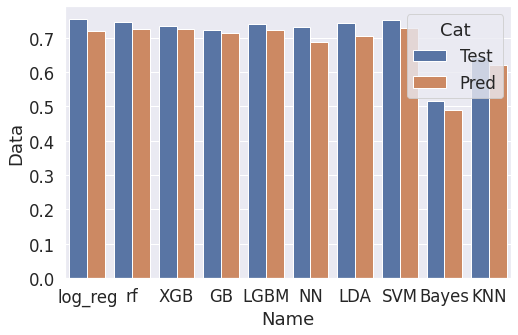

In [ ]:
plt.figure(figsize=(8, 5))
data1 = {'Name': names2,
        'Data': data,
        'Cat': ['Test', 'Pred'] * 10}
df1 = pd.DataFrame(data1)
df1 
sns.barplot(x = 'Name', y = 'Data', data=df1, hue="Cat")

### Лог регрессия

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

   recovered       0.97      0.74      0.84      1076
   uncovered       0.17      0.68      0.27        84

    accuracy                           0.74      1160
   macro avg       0.57      0.71      0.55      1160
weighted avg       0.91      0.74      0.80      1160


Площадь под ROC-кривой - 0.7092

Время работы кода - 0.0099 сек


Площадь под ROC-кривой по вероятностям 0.7540272614622057


Результат на оценочной выборке 0.7203125869069469


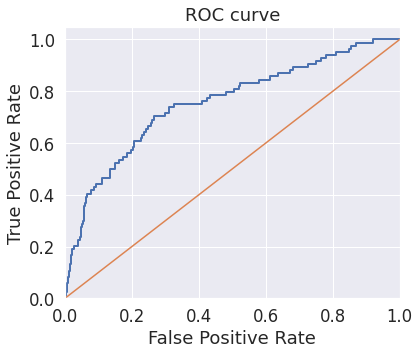

In [ ]:
start_time = process_time()

clf = LogisticRegression(random_state=0, C = 1, penalty = 'l2', solver = "liblinear")
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, clf.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке " + str(metrics.roc_auc_score(y_test2, clf.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, clf)

#### Подбор параметров

In [ ]:
from sklearn.model_selection import GridSearchCV

start_time = process_time()

parameters = {
    'C'      : [0.001,0.01,0.1,1,10,100,1000],
    'penalty': ['l1','l2','elasticnet', 'none']
    }

gr_lr = GridSearchCV(LogisticRegression(solver = 'saga', n_jobs=-1, random_state=17), parameters, cv =5, scoring = "roc_auc")
gr_lr.fit(X_train, y_train)

finish_time = process_time()
sec = finish_time - start_time

print(round(sec, 4))
gr_lr.best_params_

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

10.7932


{'C': 10, 'penalty': 'l2'}

### Случайный лес

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


              precision    recall  f1-score   support

   recovered       0.96      0.84      0.90      1076
   uncovered       0.22      0.58      0.32        84

    accuracy                           0.82      1160
   macro avg       0.59      0.71      0.61      1160
weighted avg       0.91      0.82      0.86      1160


Площадь под ROC-кривой - 0.7131

Время работы кода - 0.9897 сек


Площадь под ROC-кривой по вероятностям 0.7453199681359532


Результат на оценочной выборке  0.7239835363479615


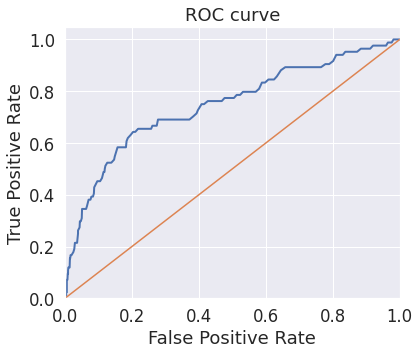

In [ ]:
start_time = process_time()

rf = RandomForestClassifier(n_estimators= 250, max_depth=None, random_state=11, criterion='entropy')
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, rf.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, rf.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, rf)

#### Подбор параметров

In [ ]:
start_time = process_time()

parameters = {
    'n_estimators'      : [100,150,200, 250],
    'max_depth'         : [7, 10, 13, None]
    }

gr_rf = GridSearchCV(ensemble.RandomForestClassifier(), parameters, cv=5, n_jobs=-1, scoring = roc_auc_scorer)
gr_rf.fit(X_train, y_train)

finish_time = process_time()
sec = finish_time - start_time

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:739: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [ ]:
print(round(sec), 4)
gr_rf.best_params_

1 4


{'max_depth': None, 'n_estimators': 250}

### XGBOOST

[0]	validation_0-auc:0.581845
Will train until validation_0-auc hasn't improved in 20 rounds.
[1]	validation_0-auc:0.585303
[2]	validation_0-auc:0.636285
[3]	validation_0-auc:0.636296
[4]	validation_0-auc:0.637513
[5]	validation_0-auc:0.637226
[6]	validation_0-auc:0.639173
[7]	validation_0-auc:0.660681
[8]	validation_0-auc:0.663818
[9]	validation_0-auc:0.665571
[10]	validation_0-auc:0.672381
[11]	validation_0-auc:0.672304
[12]	validation_0-auc:0.674328
[13]	validation_0-auc:0.674599
[14]	validation_0-auc:0.678804
[15]	validation_0-auc:0.683362
[16]	validation_0-auc:0.679407
[17]	validation_0-auc:0.682837
[18]	validation_0-auc:0.68448
[19]	validation_0-auc:0.686936
[20]	validation_0-auc:0.689646
[21]	validation_0-auc:0.688678
[22]	validation_0-auc:0.691356
[23]	validation_0-auc:0.694127
[24]	validation_0-auc:0.694006
[25]	validation_0-auc:0.703736
[26]	validation_0-auc:0.702796
[27]	validation_0-auc:0.705219
[28]	validation_0-auc:0.706779
[29]	validation_0-auc:0.707752
[30]	validation_0

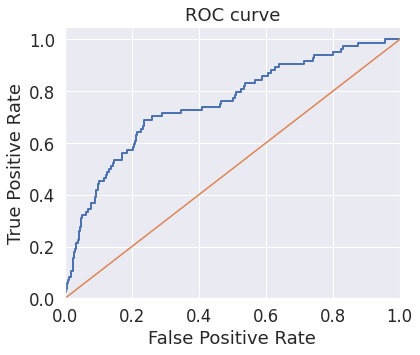

In [ ]:
start_time = process_time()
XGB = XGBClassifier(refresh_leaf =0, verbosity=0, max_depth = 3, n_estimators=150, reg_alpha=0, reg_lambda=10, sampling_method = 'gradient_based' )

xgb_model = XGB.fit(X_train, y_train,  eval_metric="auc", eval_set=[(X_test, y_test)], early_stopping_rounds=20)

y_pred = xgb_model.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, xgb_model.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, xgb_model.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, XGB)


### Градиентный бустинг

              precision    recall  f1-score   support

   recovered       0.93      1.00      0.96      1076
   uncovered       0.60      0.04      0.07        84

    accuracy                           0.93      1160
   macro avg       0.76      0.52      0.52      1160
weighted avg       0.91      0.93      0.90      1160


Площадь под ROC-кривой - 0.5169

Время работы кода - 1.5833 сек


Площадь под ROC-кривой по вероятностям 0.7423769693751106


Результат на оценочной выборке  0.7291423327215083


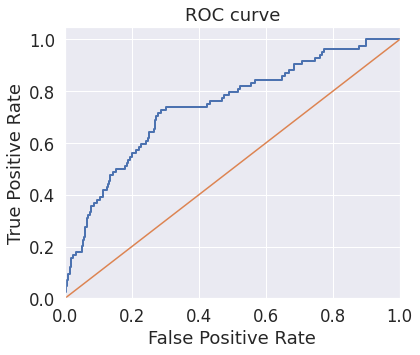

In [ ]:
start_time = process_time()

GB = GBoost(loss = 'exponential', max_depth=3, n_estimators=100, )
GB.fit(X_train, y_train)
y_pred = GB.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, GB.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, GB.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, GB)

#### Подбор параметров

In [ ]:
start_time = process_time()

parameters = {
    'n_estimators'      : [100,150,200, 250],
    'max_depth'         : [7, 10, 13, None]
    }

gr_gb = GridSearchCV(GBoost(loss = 'exponential'), parameters, cv=5, n_jobs=-1, scoring = roc_auc_scorer)
gr_gb.fit(X_train, y_train)

finish_time = process_time()
sec = finish_time - start_time

KeyboardInterrupt: ignored

In [ ]:
print(round(sec), 4)
gr_gb.best_params_

3 4


{'max_depth': 10, 'n_estimators': 150}

## LGBM

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

   recovered       0.96      0.79      0.86      1076
   uncovered       0.17      0.55      0.26        84

    accuracy                           0.77      1160
   macro avg       0.56      0.67      0.56      1160
weighted avg       0.90      0.77      0.82      1160


Площадь под ROC-кривой - 0.6679

Время работы кода - 0.1547 сек


Площадь под ROC-кривой по вероятностям 0.7502434059125509


Результат на оценочной выборке  0.6867873630346515


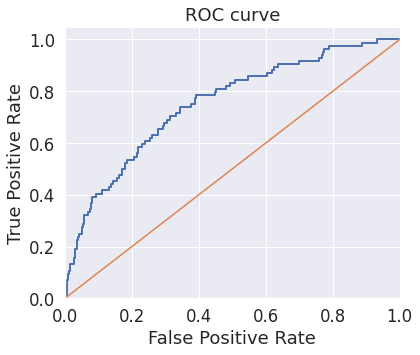

In [ ]:
import lightgbm as lgb

lgb.LGBMClassifier(refresh_leaf =0, verbosity=0, max_depth = 3, n_estimators=150, reg_alpha=0, reg_lambda=10, sampling_method = 'gradient_based' )

start_time = process_time()

lgb = lgb.LGBMClassifier(refresh_leaf =0, verbosity=0, max_depth = 3, n_estimators=150, reg_alpha=0, reg_lambda=10, sampling_method = 'gradient_based' )
lgb.fit(X_train, y_train)
y_pred = lgb.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, lgb.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, lgb.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, lgb)

## Нейросеть

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:934: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

   recovered       0.97      0.73      0.83      1076
   uncovered       0.17      0.70      0.27        84

    accuracy                           0.73      1160
   macro avg       0.57      0.72      0.55      1160
weighted avg       0.91      0.73      0.79      1160


Площадь под ROC-кривой - 0.7169

Время работы кода - 6.3967 сек


Площадь под ROC-кривой по вероятностям 0.7377190653212958


Результат на оценочной выборке  0.6922242616385783


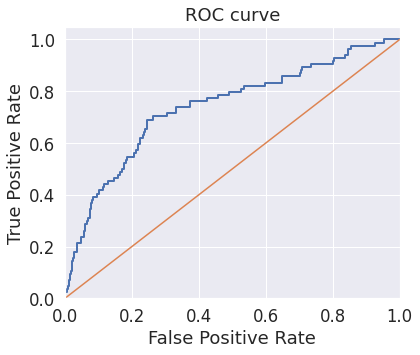

In [ ]:
start_time = process_time()


nn = MLPClassifier(activation='logistic',solver = 'adam',
                      hidden_layer_sizes=(100, 100))

nn.fit(X_train, y_train)
y_pred = nn.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, nn.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, nn.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, nn)

In [ ]:
res = []

for i in range(5, 30, 5):
  for j in range(5, 30, 5):

    print(i,j)
    start_time = process_time()


    nn = MLPClassifier(activation='logistic',
                      hidden_layer_sizes=(i,j))
    nn.fit(X_train, y_train)
    y_pred = nn.predict(X_test)

    finish_time = process_time()
    sec = finish_time - start_time

    results(y_test, y_pred, sec)

    res.append([metrics.roc_auc_score(y_test, y_pred), i, j])
    #ROC_curve(y_test, nn)

5 5
5 10
5 15
5 20
5 25
10 5
10 10
10 15
10 20
10 25
15 5
15 10
15 15
15 20
15 25
20 5
20 10
20 15
20 20
20 25
25 5
25 10
25 15
25 20
25 25


In [ ]:
res

[[0.5, 5, 5],
 [0.5, 5, 10],
 [0.5, 5, 15],
 [0.5228384324158396, 5, 20],
 [0.5, 5, 25],
 [0.5, 10, 5],
 [0.5, 10, 10],
 [0.5, 10, 15],
 [0.5, 10, 20],
 [0.5, 10, 25],
 [0.5, 15, 5],
 [0.5, 15, 10],
 [0.5, 15, 15],
 [0.5017241379310344, 15, 20],
 [0.5027217845083394, 15, 25],
 [0.5, 20, 5],
 [0.5019645963368464, 20, 10],
 [0.5, 20, 15],
 [0.5060523892356493, 20, 20],
 [0.5, 20, 25],
 [0.5, 25, 5],
 [0.5, 25, 10],
 [0.5, 25, 15],
 [0.5278624782564206, 25, 20],
 [0.5042463931239128, 25, 25]]

## LDA

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

   recovered       0.97      0.72      0.83      1076
   uncovered       0.16      0.69      0.26        84

    accuracy                           0.72      1160
   macro avg       0.56      0.71      0.54      1160
weighted avg       0.91      0.72      0.79      1160


Площадь под ROC-кривой - 0.7058

Время работы кода - 0.0434 сек


Площадь под ROC-кривой по вероятностям 0.7432731456895025


Результат на оценочной выборке  0.7049613437899772


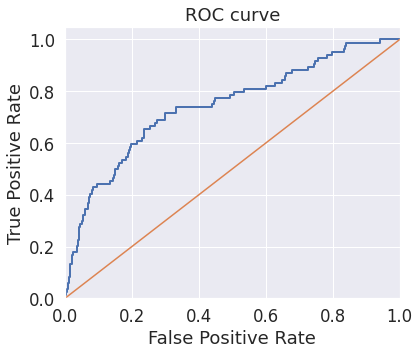

In [ ]:
start_time = process_time()

lda = LDA()
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, lda.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, lda.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, lda)

## SVM

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

   recovered       0.93      1.00      0.96      1076
   uncovered       0.00      0.00      0.00        84

    accuracy                           0.93      1160
   macro avg       0.46      0.50      0.48      1160
weighted avg       0.86      0.93      0.89      1160


Площадь под ROC-кривой - 0.5

Время работы кода - 5.2704 сек


Площадь под ROC-кривой по вероятностям 0.6438197026022305


Результат на оценочной выборке  0.5881584070304244


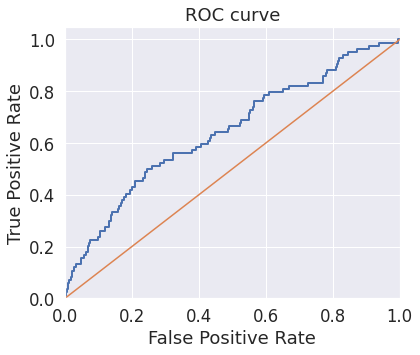

In [ ]:
start_time = process_time()

svm = SVC(gamma='auto', probability=True)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, svm.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, svm.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, svm)

#### Подбор параметров

In [ ]:
start_time = process_time()

parameters = {
    'kernel'      : ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'],
    'decision_function_shape'         : ['ovo', 'ovr']
    }

gr_svc = GridSearchCV(SVC(gamma='auto'), parameters, cv=10, n_jobs=-1)
gr_svc.fit(X_train, y_train)

finish_time = process_time()
sec = finish_time - start_time

In [ ]:
gr_svc.best_params_

## Наивный Байес

              precision    recall  f1-score   support

   recovered       0.94      0.04      0.09      1076
   uncovered       0.07      0.96      0.14        84

    accuracy                           0.11      1160
   macro avg       0.51      0.50      0.11      1160
weighted avg       0.88      0.11      0.09      1160


Площадь под ROC-кривой - 0.5044

Время работы кода - 0.0097 сек


Площадь под ROC-кривой по вероятностям 0.5080323951141795


Результат на оценочной выборке  0.4835641581845486


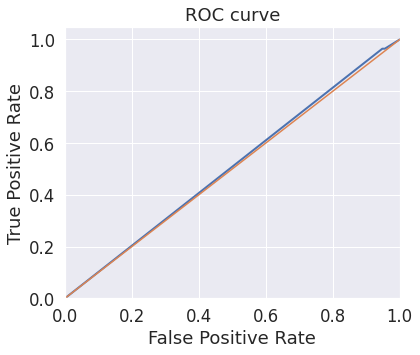

In [ ]:
GaussianNB

start_time = process_time()

Bayes = GaussianNB()
Bayes.fit(X_train, y_train)
y_pred = Bayes.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, Bayes.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, Bayes.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, Bayes)

## K-nn

              precision    recall  f1-score   support

   recovered       0.93      1.00      0.96      1076
   uncovered       0.00      0.00      0.00        84

    accuracy                           0.92      1160
   macro avg       0.46      0.50      0.48      1160
weighted avg       0.86      0.92      0.89      1160


Площадь под ROC-кривой - 0.4977

Время работы кода - 0.7852 сек


Площадь под ROC-кривой по вероятностям 0.6354830500973624


Результат на оценочной выборке  0.6102675343456254


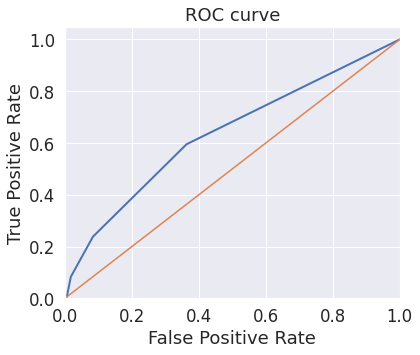

In [ ]:
start_time = process_time()

neigh = KNeighborsClassifier(n_neighbors=7)
neigh.fit(X_train, y_train)
y_pred = neigh.predict(X_test)

finish_time = process_time()
sec = finish_time - start_time

results(y_test, y_pred, sec)
print("\n")
print("Площадь под ROC-кривой по вероятностям " + str(metrics.roc_auc_score(y_test, neigh.predict_proba(X_test)[:,1])))

print("\n")
print("Результат на оценочной выборке  " + str(metrics.roc_auc_score(y_test2, neigh.predict_proba(X_to_pred)[:,1])))

ROC_curve(y_test, neigh)